## Analysis of Bigrams

1. Take any corpus(article) of your choice and analyze all the bigrams present based on ConditionalFrequencyDist and compute the co-occurence matrix.
2. Visualize the co-occurence matrix.

In [24]:
from nltk.wsd import lesk
import nltk
from nltk.corpus import stopwords
from nltk.tokenize import sent_tokenize,word_tokenize,regexp_tokenize
from nltk.tokenize import PunktSentenceTokenizer
from nltk.corpus import wordnet
from nltk.corpus import state_union
from nltk.util import ngrams    
from collections import Counter

In [25]:
import nltk.tag
from nltk.tag import brill,AffixTagger,UnigramTagger,BigramTagger,TrigramTagger

In [26]:
from nltk.corpus import brown
brown_words = brown.words()

In [27]:
brown_words

['The', 'Fulton', 'County', 'Grand', 'Jury', 'said', ...]

In [29]:
bigrams = ngrams(brown_words,2)
print(Counter(bigrams))

Counter({('of', 'the'): 9625, (',', 'and'): 6288, ('.', 'The'): 6081, ('in', 'the'): 5546, (',', 'the'): 3754, ('.', '``'): 3515, ('to', 'the'): 3426, ("''", '.'): 3332, (';', ';'): 2784, ('.', 'He'): 2660, ('?', '?'): 2346, ('on', 'the'): 2297, ('and', 'the'): 2136, ("''", ','): 2032, (',', 'but'): 1856, ('.', 'It'): 1836, ('for', 'the'): 1759, ('to', 'be'): 1697, ('.', 'In'): 1619, ('at', 'the'): 1506, (',', 'he'): 1489, ('with', 'the'): 1472, ('of', 'a'): 1461, ('that', 'the'): 1368, ('from', 'the'): 1351, ('in', 'a'): 1316, ('by', 'the'): 1310, (',', 'a'): 1294, ('.', 'But'): 1226, ('.', 'I'): 1197, (',', '``'): 1093, (',', 'in'): 1064, ('.', 'This'): 1060, ('.', 'A'): 976, (',', 'as'): 965, ("''", '?'): 915, ('as', 'a'): 896, ('it', 'is'): 881, ('with', 'a'): 881, ('is', 'a'): 864, ('of', 'his'): 806, ('!', '!'): 798, ('is', 'the'): 782, ('was', 'a'): 776, (',', 'it'): 775, ('.', 'They'): 773, ('.', 'She'): 767, ('had', 'been'): 760, ('.', 'There'): 754, ('it', 'was'): 743, (',', 

In [30]:
text = """I went to Bangalore.
          He went to Mumbai.
          She went to Hyderabad"""

In [69]:
text_words = word_tokenize(text)
p = len(text_words)
p

14

In [39]:
bigrams1 = ngrams(text_words,2)
c = Counter(bigrams1)
print(c)

Counter({('went', 'to'): 3, ('.', 'He'): 1, ('She', 'went'): 1, ('to', 'Bangalore'): 1, ('to', 'Hyderabad'): 1, ('.', 'She'): 1, ('Bangalore', '.'): 1, ('Mumbai', '.'): 1, ('He', 'went'): 1, ('to', 'Mumbai'): 1, ('I', 'went'): 1})


In [44]:
s = c.items()
s

dict_items([(('.', 'He'), 1), (('She', 'went'), 1), (('to', 'Bangalore'), 1), (('to', 'Hyderabad'), 1), (('went', 'to'), 3), (('.', 'She'), 1), (('Bangalore', '.'), 1), (('Mumbai', '.'), 1), (('He', 'went'), 1), (('to', 'Mumbai'), 1), (('I', 'went'), 1)])

In [45]:
type(s)

dict_items

In [47]:
keys = []
for i in s:
    keys.append(i[0])
keys    

[('.', 'He'),
 ('She', 'went'),
 ('to', 'Bangalore'),
 ('to', 'Hyderabad'),
 ('went', 'to'),
 ('.', 'She'),
 ('Bangalore', '.'),
 ('Mumbai', '.'),
 ('He', 'went'),
 ('to', 'Mumbai'),
 ('I', 'went')]

In [49]:
counts = []
for i in s:
    counts.append(i[1])
counts   


[1, 1, 1, 1, 3, 1, 1, 1, 1, 1, 1]

In [77]:
from sklearn.feature_extraction.text import CountVectorizer
#docs = ['this this this book',
        #'this cat good',
        #'cat good shit']
docs = [ """The agent will book the to the show for the entire family."""]         
count_model = CountVectorizer(ngram_range=(0,1)) 
X = count_model.fit_transform(docs)
Xc = (X.T * X) # this is co-occurrence matrix in sparse csr format
Xc.setdiag(0) # sometimes you want to fill same word cooccurence to 0
print(Xc.todense())

[[0 1 1 1 1 1 4 1 1]
 [1 0 1 1 1 1 4 1 1]
 [1 1 0 1 1 1 4 1 1]
 [1 1 1 0 1 1 4 1 1]
 [1 1 1 1 0 1 4 1 1]
 [1 1 1 1 1 0 4 1 1]
 [4 4 4 4 4 4 0 4 4]
 [1 1 1 1 1 1 4 0 1]
 [1 1 1 1 1 1 4 1 0]]


In [66]:
from sklearn.feature_extraction.text import CountVectorizer
import numpy as np
samples = ['awesome unicorns are awesome','batman forever and ever','I love batman forever']
bigram_vectorizer = CountVectorizer(ngram_range=(1, 2), vocabulary = {'awesome unicorns':0, 'batman forever':1}) 
co_occurrences = bigram_vectorizer.fit_transform(samples)
print('Printing sparse matrix:', co_occurrences)
print('Printing dense matrix (cols are vocabulary keys 0-> "awesome unicorns", 1-> "batman forever")', co_occurrences.todense())
sum_occ = np.sum(co_occurrences.todense(),axis=0)
print('Sum of word-word occurrences:', sum_occ)
print('Pretty printig of co_occurrences count:', zip(bigram_vectorizer.get_feature_names(),np.array(sum_occ)[0].tolist()))

Printing sparse matrix:   (0, 0)	1
  (1, 1)	1
  (2, 1)	1
Printing dense matrix (cols are vocabulary keys 0-> "awesome unicorns", 1-> "batman forever") [[1 0]
 [0 1]
 [0 1]]
Sum of word-word occurrences: [[1 2]]
Pretty printig of co_occurrences count: <zip object at 0x7fd99a56f4c8>


### Part2

In [88]:
import nltk
import pandas as pd
import numpy as np
 
import matplotlib.pyplot as plt
from nltk.tokenize import word_tokenize
import seaborn as sns
from nltk import FreqDist

sample = """I went to Bangalore.
          He went to Mumbai.
          She went to Hyderabad."""
words = word_tokenize(sample)
freq = nltk.FreqDist(words)
condtional_freq_dist = nltk.ConditionalFreqDist(nltk.bigrams(words))
condtional_freq_dist
correlation= pd.DataFrame(condtional_freq_dist)
correlation.fillna(0)

,.,Bangalore,He,Hyderabad,I,Mumbai,She,to,went
.,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0,0.0
Bangalore,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
He,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
Hyderabad,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
Mumbai,0.0,0.0,0.0,0.0,0.0,0.0,0.0,1.0,0.0
She,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
to,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,3.0
went,0.0,0.0,1.0,0.0,1.0,0.0,1.0,0.0,0.0


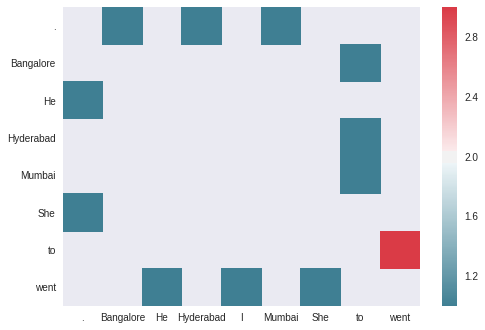

In [87]:

sns.heatmap(correlation, mask=np.zeros_like(correlation, dtype=np.bool), 
            cmap = sns.diverging_palette(220, 10, as_cmap=True))
plt.show()
